In [429]:
#please note that this notebook is an amalgamation of a few different notebooks that I have used so far.
#the process of getting and cleaning my data has been a challenge and so the other notebooks are somewhat messy and this 
#is an attempt to summarize it up to a certain point.

import requests
import re
import json
from bs4 import BeautifulSoup
import pandas as pd
import numpy as np
from pandas.io.json import json_normalize
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
#define a function to parse information from a json file retireved from BreweryDB api and saved it to a CSV as it went
#in order to make sure data was preserved
rows = []

def parse_beer(beer):
    return [beer.get('id'),
            beer.get('name'), 
            beer.get('abv'), 
            beer.get('ibu'),
            beer.get('originalGravity'),
            beer.get('style',{}).get('ogMin'),
            beer.get('isOrganic'),
            beer.get('style', {}).get('categoryId'),
            beer.get('style', {}).get('category', {}).get('name'),
            beer.get('styleId'),
            beer.get('style', {}).get('name'),
            beer.get('style', {}).get('description'),
            beer.get('servingTemperatureDisplay'),
            beer.get('foodPairings'),
            beer.get('description'),
            beer.get('labels', {}).get('medium'),
            beer.get('glasswareId'),
            beer.get('glass', {}).get('name'),
            beer.get('srmId'),
            beer.get('srm', {}).get('hex'),
            beer.get('style', {}).get('srmMin'),
            beer.get('style', {}).get('srmMax')
           ]


ibus = range(80,150)
for ibu in ibus:
    if ibu % 2 == 0:
        print ibu
        pd.DataFrame(rows).to_csv('saved_beers.csv', encoding='utf-8')
    r = requests.get('http://api.brewerydb.com/v2/beers/?key=API_KEY&p=1&ibu='+str(ibu))
    response = r.json()
    rows += [parse_beer(r) for r in response['data']]
    if response['numberOfPages'] > 1:
        page = range(2,response['numberOfPages']+1)
        for p in page:
            response = requests.get('http://api.brewerydb.com/v2/beers/?key=API_KEY&p='+str(p)+'&ibu='+str(ibu)).json()
            rows += [parse_beer(r) for r in response['data']]

In [ ]:
#save data as it is made.  this is just one example of the save that needed to be done twice due to daily limits
beers = pd.DataFrame(rows)
beers.to_csv('beers.csv', encoding = 'utf-8')

In [ ]:
#call one of the files created above
beer_list = pd.read_csv('beers_redux2.csv')

In [ ]:
#columns needed to be named in order to properly merge the 2 csv files that were created
beer_list.columns = ['unknown',
                     'id',
                     'name',
                     'abv',
                     'ibu',
                     'originalGravity',
                     'ogMin',
                     'isOrganic',
                     'categoryId',
                     'category_name',
                     'styleId',
                     'style_name',
                     'style_description',
                     'servingTemperature',
                     'foodPairings',
                     'beer_description',
                     'labels',
                     'glasswareId',
                     'glass_name',
                     'srmId',
                     'srm_hex',
                     'srmMin',
                     'srmMax'
                     ]
beer_list.head()

In [ ]:
#Concat the two dataframes created from the 2 main csv file that were a product of parsing the json file.
beers = pd.concat([beer_list2,beer_list], axis = 0)

In [ ]:
#pull up the csv that holds all the data from my API pull
beers= pd.read_csv('beers.csv')

In [ ]:
#check to see what values are missing from the API information
beers.isnull().sum()

In [ ]:
#remove feature columns that have too many missing values to be useful
beer = beers.drop(['Unnamed: 0','unknown','servingTemperature','foodPairings','labels','glasswareId','glass_name','srm_hex'], axis=1)

In [ ]:
#The process of filling in NaN values begins with filling in missing srmId(color code) values by using the average of the defined
#min and max srm for a  given style of beer(if i have that information)
for index, row in beer.iterrows():
#     print row['srmId']>0
    if not row['srmId'] > 0:
#         print  (row['srmMin']+row['srmMax'])/2
        beer.loc[index, 'srmId'] = (row['srmMin']+row['srmMax'])/2
    if not row['originalGravity'] > 0:
        beer.loc[index, 'originalGravity'] = row['ogMin']
    
beer.isnull().sum()

In [ ]:
#this is the first in a series of 3 functions defined to help fill in missing beer_description values.  It takes a beer name from
#my dataframe and searches beeradvocate.com. If there is a result it will parse the HTML to return the link to the profile page
#of the first beer from the search results. note: this is not fool proof as it is highly possible that the first search result
#was not the exact beer I was looking for.
reg_tag = re.compile("/beer/profile/\d+/\d+/")
a_tag = b.findAll('a' , attrs={'href': reg_tag})
def get_url_from_beer_name(name):
    urls = []
    r= requests.get('https://www.beeradvocate.com/search/?q='+name.lower()+'&qt=beer')
    b = BeautifulSoup(r.text, 'html.parser')
    a_tag = b.findAll('a' , attrs={'href': reg_tag})
    for link in a_tag:
        urls.append(link.get('href'))
    if urls:
        return urls[0]
    return None

In [ ]:
# This is the second fucntion used to get a beer description.  It takes the url that was found in the previous function and
#parses it to find the description on the profile page for that beer.
def get_desc_from_advocate(url):
    r= requests.get('https://www.beeradvocate.com'+url)
    b = BeautifulSoup(r.text, 'html.parser')
    brs = b.findAll('br')
    for index, be in enumerate(brs):
        if 'notes' in be.text.lower():
            return brs[index+1].text.split('Notes / Commercial Description:')[1].strip()

In [ ]:
#test the first function
get_url_from_beer_name('stella artois')

In [ ]:
#test the second function
get_desc_from_advocate('169/449')

In [ ]:
#this function combines the previous 2 functions into 1
def get_desc_from_beer_name(name):
    url = get_url_from_beer_name(name)
    if url:
        return get_desc_from_advocate(url)
    else:
        return None

In [ ]:
#test it
get_desc_from_beer_name("ace of simcoe")

In [ ]:
#create a for loop to fill in the beer_description for any NaN values in the DataFrame
done = 0
for index, row in beer.iterrows():
    if not row['beer_description'] > 0 and row['name']:
        beer.loc[index, 'beer_description'] = get_desc_from_beer_name(row['name'])
        done += 1
        if done % 20 == 0:
            print done

In [ ]:
#check to see how many are still NaN
beer.isnull().sum()

In [ ]:
#save Progress
beer.to_csv('beers2.csv', encoding = 'utf-8')

In [2]:
#reinstantiate DataFrame. note: everything from here down was worked on solely in this notebook unlike the summary above.
beer = pd.read_csv('beers2.csv')

In [3]:
#view top 10 rows of beer DataFrame
beer.head(10)

,Unnamed: 0,id,name,abv,ibu,originalGravity,ogMin,isOrganic,categoryId,category_name,styleId,style_name,style_description,beer_description,srmId,srmMin,srmMax
0,0,njehqH,144 IPA,NaN,0,1.060,1.060,N,3.0,North American Origin Ales,30.0,American-Style India Pale Ale,American-style India pale ales are perceived t...,Duplicate listingAdded by ThatsThatDude on 05-...,10.0,6.0,14.0
1,1,EVVV1r,1488 Whisky Beer,7.0,0,NaN,NaN,N,11.0,Hybrid/mixed Beer,138.0,Other Strong Ale or Lager,Any style of beer can be made stronger than th...,No notes at this time.Added by geexploitation ...,NaN,NaN,NaN
2,2,295GZo,19 Original Colonies,5.5,0,1.008,NaN,Y,12.0,"Mead, Cider, & Perry",148.0,Open Category Mead,This mead should exhibit the character of all ...,19 Original Colonies Mead is brewed using 5 in...,NaN,NaN,NaN
3,3,Np1soi,666 Premium British Beer,6.6,0,1.033,1.033,N,1.0,British Origin Ales,3.0,Ordinary Bitter,Ordinary bitter is gold to copper colored with...,NaN,8.5,5.0,12.0
4,4,7xU7NH,Ace of Simcoe,4.5,0,NaN,NaN,N,3.0,North American Origin Ales,164.0,Session India Pale Ale,Session India Pale Ales are gold to copper. Ch...,"Single hop awesomeness, shining a spotlight on...",NaN,NaN,NaN
5,5,KgqNri,After Party Pale Ale,5.3,0,1.060,1.060,N,3.0,North American Origin Ales,30.0,American-Style India Pale Ale,American-style India pale ales are perceived t...,Duplicate of https://www.beeradvocate.com/beer...,10.0,6.0,14.0
6,6,TwnIXA,Amber Rye,5.5,0,1.044,1.044,N,8.0,North American Lager,97.0,American-Style Premium Lager,This style has low malt (and adjunct) sweetnes...,No notes at this time.Added by on 09-16-2009,4.0,2.0,6.0
7,7,O6CToa,American Barley Wine,11.5,0,1.090,1.090,N,3.0,North American Origin Ales,34.0,American-Style Barley Wine Ale,American style barley wines range from amber t...,No notes at this time.Added by mattvandyk on 0...,16.5,11.0,22.0
8,8,3D7Ba5,American IPA,5.0,0,1.060,1.060,N,3.0,North American Origin Ales,30.0,American-Style India Pale Ale,American-style India pale ales are perceived t...,Our American IPA gets its bold hop flavor from...,10.0,6.0,14.0
9,9,MDmjnK,Artesian Light Ale,3.8,0,1.045,1.045,N,3.0,North American Origin Ales,36.0,Golden or Blonde Ale,Golden or Blonde ales are straw to golden blon...,No notes at this time.Added by EmperorBevis on...,5.0,3.0,7.0


In [4]:
#check how many values are still missing
beer.isnull().sum()

Unnamed: 0              0
id                      0
name                    0
abv                   193
ibu                     0
originalGravity      1126
ogMin                1407
isOrganic               0
categoryId             76
category_name          76
styleId                76
style_name             76
style_description      80
beer_description      931
srmId                1066
srmMin               1385
srmMax               1416
dtype: int64

In [4]:
#check to see what what values were filled in from the web scraping for beer_description.
#oh crap.  there are what amounts to "NaN" values still ad also useless information in the 'Added by'.
beer['beer_description'].value_counts()

No notes at this time.Added by Quaffer on 09-04-2001                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                24
Esquire Magazine calls our 90 Minute IPA "perhaps the best IPA in America." An imperial IPA best savored from a snifter, 90 Minut

In [5]:
#define a function to turn the 'No Notes At This Time' form beeradvocate.com into NaN values.
def f(x):
    if x and type(x) is not float:
        if 'No notes at thi' in x:
            return None
        
        return x.split('Added')[0]

In [6]:
#apply the function to the desired column
beer['beer_description'] = beer['beer_description'].apply(f)

In [7]:
#check the results.
#crap still a lot of missing values but only 76 missing stylyId so I can fill those in by hand without too much trouble.
beer.isnull().sum()

Unnamed: 0              0
id                      0
name                    0
abv                   193
ibu                     0
originalGravity      1126
ogMin                1407
isOrganic               0
categoryId             76
category_name          76
styleId                76
style_name             76
style_description      80
beer_description     2865
srmId                1066
srmMin               1385
srmMax               1416
dtype: int64

In [502]:
#pull up the first instance of a missing styleId.  note: there are not more missing values for this column in the DataFrame anymore
beer[beer['styleId'].isnull() == True].head(1)


,Unnamed: 0,id,name,abv,ibu,originalGravity,ogMin,isOrganic,categoryId,category_name,styleId,style_name,style_description,beer_description,srmId,srmMin,srmMax,duplicate


In [499]:
#read the description to determine the style.  If there is not description or if the description is not helpful just google the
#beer and see what kind of styly it is.
beer.iloc[19538,13]

'This hop megatron bomb blasts your palette in places you didn\xe2\x80\x99t know you had taste buds.  Brilliantly golden, with a faintly green hue due to the incessant hop additions that continue from 1st wort through the boil, the hopback, primary and secondary fermentations, cold aging and the serving vessel\xe2\x80\x94this skillfully crafted beer has enough alpha acids in it to bitter a barleywine three times its size.  A liquid death-metal lyric to the essential essence of humulus lupulus--not for the faint of hop.'

In [500]:
#fill in the styleId and sty_name from search results.
#take the opportunity to fill in any missing information for these beers.  Some had missing IBU, ABV, or descriptions
beer.iloc[19237, 13] = 'We brewed this ale with the famous sake yeast No 7 from Masumi Sake in Nagano, Japan. On advise from Masumi’s master brewers, we fermented this ale very slowly at low temperatures to bring out No 7’s fabulously fruity character. This product is unfiltered and unpasteurized. Please enjoy chilled! Special thanks to Masumi!' 
beer.iloc[19538,10] = 31
beer.iloc[19538,11] = 'Imperial or Double India Pale Ale'

In [501]:
#this was my history of changes to make sure that if I made a mistake above I could know about it and fix it easily
print beer.iloc[19538,13]
print beer.iloc[19538,10]
print beer.iloc[19538,11]

This hop megatron bomb blasts your palette in places you didn’t know you had taste buds.  Brilliantly golden, with a faintly green hue due to the incessant hop additions that continue from 1st wort through the boil, the hopback, primary and secondary fermentations, cold aging and the serving vessel—this skillfully crafted beer has enough alpha acids in it to bitter a barleywine three times its size.  A liquid death-metal lyric to the essential essence of humulus lupulus--not for the faint of hop.
31.0
Imperial or Double India Pale Ale


In [77]:
#uh oh there are duplicate names.  This actually makes sense since some names of beers are as broad as 'Octoberfest'.
#There is a unique id for each row so this should just be duplicate names and not duplicate beers.
beer['duplicate'] = beer['name'].duplicated(keep = False)
beer.duplicate.value_counts()

False    16984
True      2569
Name: duplicate, dtype: int64

In [566]:
#save the progress of filling in styleId information
beer.to_csv('beer_11_16.csv', encoding = 'utf-8')

In [4]:
#reinstantiate beer with the new saved data
beer = pd.read_csv('beer_11_16.csv')

In [6]:
#checking to see what columns have overlapping NaN values.
beer.isnull().sum()

Unnamed: 0              0
Unnamed: 0.1            0
id                      0
name                    0
abv                   193
ibu                     0
originalGravity      1124
ogMin                1407
isOrganic               0
categoryId             76
category_name          76
styleId                 0
style_name              0
style_description      80
beer_description     2859
srmId                1065
srmMin               1385
srmMax               1416
duplicate               0
dtype: int64

In [7]:
#Time to start trying to predict my missing values based on 
import nltk
from sklearn.cross_validation import train_test_split, cross_val_score
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from textblob import TextBlob, Word
from nltk.stem.snowball import SnowballStemmer
from sklearn.grid_search import GridSearchCV
from sklearn.pipeline import Pipeline, FeatureUnion, make_pipeline, make_union
from sklearn.base import TransformerMixin, BaseEstimator
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor

In [8]:
#create a training set that has non NaN values for all columns
beer_train = beer.dropna()

In [9]:
beer_train.shape

(15322, 19)

In [10]:
beer_train.isnull().sum()

Unnamed: 0           0
Unnamed: 0.1         0
id                   0
name                 0
abv                  0
ibu                  0
originalGravity      0
ogMin                0
isOrganic            0
categoryId           0
category_name        0
styleId              0
style_name           0
style_description    0
beer_description     0
srmId                0
srmMin               0
srmMax               0
duplicate            0
dtype: int64

In [29]:
#One of the beer specific columns in the DataFrame is text.  This means that I need a way to to isloate the text column from the
#numeic columns in order to vectorize them.  Then I will need to featureunion them with the numeric columns.  That means I need
#to create two custom transformers that will fit into a pipeline to accomplish this.
class Text_to_Vector(BaseEstimator, TransformerMixin):
    def transform(self, X, **transform_params):
               
        return X['beer_description'].map(lambda x:x.lower())

    def fit(self, X, y=None, **fit_params):
        return self
    
class Get_Numeric_Features(BaseEstimator, TransformerMixin):
    def transform(self, X, **transform_params):
        return X[feature_cols]
    
    def fit(self, X, y=None, **fit_params):
        return self

In [ ]:
#A pipeline that will use KNN to predict styleId from the other feature columns.  This was experimentation in using machine
#learning that I did before deciding to fill in missing styleId values by hand.
pipe = Pipeline([
    ('features', FeatureUnion([
        ('textcount', Pipeline([
            ('text', Text_to_Vector()),
            ('counts', CountVectorizer(max_features=50, stop_words='english'))
        ])),
        ('texttfidf', Pipeline([
            ('text', Text_to_Vector()),    
            ('tf_idf', TfidfVectorizer(max_features=50, stop_words='english'))
        ])),
        ('scale_num', Pipeline([
            ('numeric', Get_Numeric_Features()),
            ('scale', StandardScaler())
        ]))])),
    ('classifier', KNeighborsClassifier())
    ])

In [ ]:
#Grid Search the KNN pipeline
param_grid = {'classifier__n_neighbors':range(1,30),
              'features__textcount__counts__ngram_range': [(1, 1), (1, 2), (1,3)],
              'features__texttfidf__tf_idf__ngram_range':[(1, 1), (1, 2), (1,3)]}
grid = GridSearchCV(pipe, param_grid, cv=5, scoring='accuracy')
grid.fit(beer_train.drop('styleId', axis=1),beer_train.styleId)

grid.grid_scores_
grid_mean_scores = [result[1] for result in grid.grid_scores_]

In [13]:
# A pipeline that will use RandomForestClassifier to predict styleId
pipe_rf = Pipeline([
    ('features', FeatureUnion([
        ('textcount', Pipeline([
            ('text', Text_to_Vector()),
            ('counts', CountVectorizer(max_features=50, stop_words='english'))
        ])),
        ('texttfidf', Pipeline([
            ('text', Text_to_Vector()),    
            ('tf_idf', TfidfVectorizer(max_features=50, stop_words='english'))
        ])),
        ('numeric', Get_Numeric_Features())
        ])),
    ('classifier', RandomForestClassifier())
    ])

In [ ]:
#Grid search the RandomForest pipeline
feature_cols = ['ibu', 'originalGravity', 'abv', 'srmId',]
param_grid_rf = {'classifier__n_estimators' :range(10,310,10),
              'features__textcount__counts__ngram_range': [(1, 1), (1, 2), (1,3)],
              'features__texttfidf__tf_idf__ngram_range':[(1, 1), (1, 2), (1,3)]}
grid = GridSearchCV(pipe_rf, param_grid_rf, cv=5, scoring='mean_squared_error')
grid.fit(beer_train.drop('styleId', axis=1),beer_train.styleId)

grid.grid_scores_
grid_mean_scores = [result[1] for result in grid.grid_scores_]

In [79]:
#after deciding to fill in missing styleId values by hand the next step is to try to fill in other missing values.
#This is a pipeline used to predict the value of 'originalGravity'.  I used a regressor instead of a classifier becuase
#'originalGravity' is continuous response.
pipe_num = Pipeline([
        ('features', Get_Numeric_Features()),
        ('classifier', RandomForestRegressor())
    ])

In [80]:
#Grid Search the RF regressor pipeline.
feature_cols = ['ibu', 'abv', 'srmId','styleId']
X_train = beer_train[feature_cols]
y_train = beer_train['originalGravity']
param_grid_rf = {'classifier__n_estimators' :range(10,510,10), 'classifier__max_features' : range(1, len(feature_cols)+1)}
grid = GridSearchCV(pipe_num, param_grid_rf, cv=5, scoring='mean_squared_error')
grid.fit(X_train,y_train)
grid.grid_scores_
grid_mean_scores = [result[1] for result in grid.grid_scores_]

In [81]:
#view the results
print grid_mean_scores
print grid.grid_scores_
print grid.best_score_
print grid.best_params_

[-0.0002028118621263558, -0.00019707058180120152, -0.00018558765961274674, -0.00018557666114406705, -0.0001856172567933317, -0.00018663399896518693, -0.00018588303102206612, -0.00018510992784126737, -0.00018688738895385141, -0.00018538900913101235, -0.00018544228348939306, -0.00018545126357825384, -0.00018555842869803768, -0.00018450276093225133, -0.00018386243741307852, -0.00018391082285229343, -0.00018388199905885547, -0.0001844624343860209, -0.00018545869106564264, -0.00018420157277834198, -0.00018452596957566254, -0.00018348750847867887, -0.00018467895541741933, -0.00018376417154435367, -0.00018492949639498072, -0.00018383492137193235, -0.00018389816746817742, -0.00018390723815985861, -0.00018395613684730677, -0.00018525720829264816, -0.00018401418094255662, -0.00018378457252088618, -0.0001847838211154382, -0.00018418273127242466, -0.00018402553385646041, -0.0001841581380483641, -0.00018390970283079327, -0.00018484954083301464, -0.00018455973104188707, -0.00018358521820981293, -0.0

In [83]:
#check the root mean squared error.  This error is too high for trying to predict a number betweet 1.001 and 1.099
RMSE = []

for i in grid_mean_scores:
    RMSE.append(np.mean(np.sqrt(-i)))

RMSE

[0.014241202973286906,
 0.014038182995003361,
 0.013623056177405522,
 0.013622652500305036,
 0.013624142424142949,
 0.013661405453509787,
 0.013633892731794032,
 0.0136055109364282,
 0.013670676243472794,
 0.013615763259215855,
 0.013617719467274726,
 0.013618049184015081,
 0.013621983287981148,
 0.01358317933814655,
 0.013559588393940227,
 0.013561372454596675,
 0.013560309696273734,
 0.013581694827451429,
 0.013618321888751296,
 0.01357208800363238,
 0.013584033626859974,
 0.013545756105831776,
 0.013589663550560011,
 0.013555964426935978,
 0.013598878497691666,
 0.013558573721890232,
 0.013560905849838255,
 0.013561240288404988,
 0.013563043052623064,
 0.013610922389487355,
 0.013565182672657107,
 0.013556716878392282,
 0.013593521291977226,
 0.013571393858864486,
 0.013565601124036502,
 0.013570487760149378,
 0.013561331159985486,
 0.01359593839471975,
 0.013585276259314239,
 0.013549362280558187,
 0.013563579986057075,
 0.013579528007867993,
 0.013577764070179642,
 0.0135618259771

In [543]:
#Try KNN
pipe_num_knn = Pipeline([
        ('features', Get_Numeric_Features()),
        ('classifier', KNeighborsClassifier())
    ])

In [544]:
#oops KNN cant take a continuos response I guess.
feature_cols = ['ibu', 'abv', 'srmId']
X_train = beer_train[feature_cols]
y_train = beer_train['originalGravity']
param_grid = {'classifier__n_neighbors':range(1,30)}
grid = GridSearchCV(pipe_num_knn, param_grid, cv=5, scoring='accuracy')
grid.fit(beer_train.drop('styleId', axis=1),beer_train.styleId)

grid.grid_scores_
grid_mean_scores = [result[1] for result in grid.grid_scores_]

TypeError: __init__() takes at least 3 arguments (4 given)

In [545]:
#lets try a Linear Regression.
from sklearn.linear_model import LinearRegression
def cross_val_rmse(X, y):
    linreg = LinearRegression()
    scores = cross_val_score(linreg, X, y, cv=5, scoring='mean_squared_error')
    return np.sqrt(abs(scores)).mean()

In [547]:
#even higher RMSE.
feature_cols = ['ibu', 'abv', 'srmId', 'styleId']
X_train = beer_train[feature_cols]
y_train = beer_train['originalGravity']
cross_val_rmse(X_train, y_train)

0.014730779612579176

In [550]:
#check the correlation between the feature columns. probably should have done this earlier.
beer_train[['ibu','abv', 'originalGravity', 'styleId', 'srmId']].corr()

,ibu,abv,originalGravity,styleId,srmId
ibu,1.000000,0.480048,0.398412,-0.331372,0.017132
abv,0.480048,1.000000,0.530045,-0.099007,0.227386
originalGravity,0.398412,0.530045,1.000000,-0.185384,0.086400
styleId,-0.331372,-0.099007,-0.185384,1.000000,0.023103
srmId,0.017132,0.227386,0.086400,0.023103,1.000000


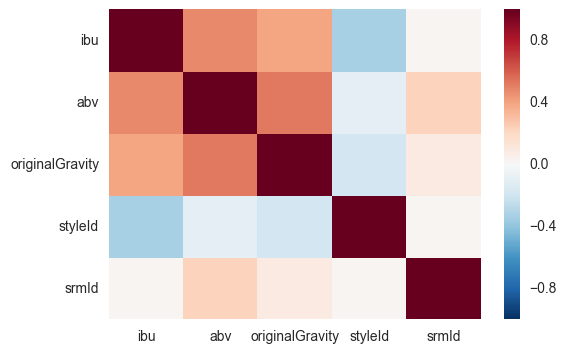

In [553]:
#more EDA that should have been done earlier.
sns.heatmap(beer_train[['ibu','abv', 'originalGravity', 'styleId', 'srmId']].corr())

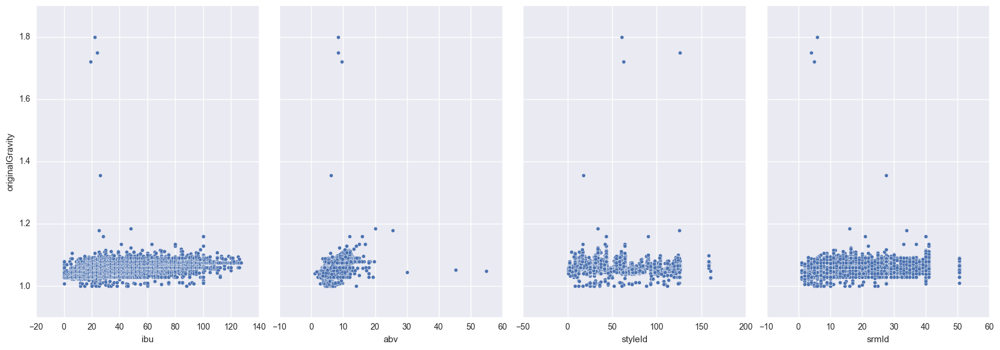

In [555]:
sns.pairplot(beer_train, x_vars=['ibu','abv', 'styleId', 'srmId'], y_vars= 'originalGravity', size=6, aspect=0.7)

In [52]:
pipe_num = Pipeline([
        ('features', Get_Numeric_Features()),
        ('classifier', DecisionTreeRegressor())
    ])

In [56]:
feature_cols = ['ibu', 'abv','styleId', 'srmId']
X_train = beer_train[feature_cols]
y_train = beer_train['originalGravity']
param_grid_rf = {'classifier__max_features' : range(1, len(feature_cols)+1)}
grid = GridSearchCV(pipe_num, param_grid_rf, cv=5, scoring='mean_squared_error')
grid.fit(X_train,y_train)
grid.grid_scores_
grid_mean_scores = [result[1] for result in grid.grid_scores_]

In [57]:
RMSE = []

for i in grid_mean_scores:
    RMSE.append(np.mean(np.sqrt(-i)))

RMSE

[0.019517798083113994,
 0.019958828743142011,
 0.018346095123278418,
 0.015053484474450048]

In [58]:
print grid.best_params_

{'classifier__max_features': 4}


In [11]:
from sklearn.ensemble import BaggingRegressor


In [60]:


#def cross_val_rmse(X, y):
    #treereg = DecisionTreeRegressor(max_features = 5)
    #bagreg = BaggingRegressor(treereg, n_estimators=300, bootstrap=True, oob_score=True, random_state=1)
    #scores = cross_val_score(bagreg, X, y, cv=5, scoring='mean_squared_error')
    #return np.sqrt(abs(scores)).mean()

treereg = DecisionTreeRegressor(max_features = 4)
bagreg = BaggingRegressor(treereg, bootstrap=True, oob_score=True, random_state=1)    
feature_cols = ['ibu', 'abv','styleId', 'srmId']
X_train = beer_train[feature_cols]
y_train = beer_train['originalGravity']
param_grid_bag = {'n_estimators' : range(10,510,10)}
grid = GridSearchCV(bagreg, param_grid_bag, cv=5, scoring='mean_squared_error')
grid.fit(X_train,y_train)
grid.grid_scores_
grid_mean_scores = [result[1] for result in grid.grid_scores_]
        
#cross_val_rmse(X_train, y_train)

In [61]:
RMSE = []

for i in grid_mean_scores:
    RMSE.append(np.mean(np.sqrt(-i)))

RMSE

[0.014994945403046521,
 0.01472096680538003,
 0.014417451250899584,
 0.014389796991772834,
 0.014237451074400343,
 0.014215901259088034,
 0.014252032185802142,
 0.014169002764411727,
 0.014114112242315981,
 0.014123334123114003,
 0.014066054970951921,
 0.0141102654193154,
 0.014102994505163755,
 0.014111471195355963,
 0.014093898948279598,
 0.014103369223711524,
 0.014132824399321542,
 0.014153432025869859,
 0.014153561114350996,
 0.014137108321017878,
 0.014120539752274916,
 0.014110501682614011,
 0.01413599669118781,
 0.01412384745565368,
 0.014105246940404057,
 0.014123116830740849,
 0.014139067796526916,
 0.01413453261509739,
 0.014124056889341294,
 0.014127861552343827,
 0.014134363425708138,
 0.01413341363584911,
 0.014135056771812963,
 0.014121284145973629,
 0.014144930558867584,
 0.014148686657939846,
 0.014148390790167262,
 0.01414100646976502,
 0.014124005021897534,
 0.014121917607704178,
 0.014107794425478054,
 0.014097650051889928,
 0.014103168075968288,
 0.0141073685035629

In [62]:
print grid.best_params_

{'n_estimators': 110}


In [64]:
pipe_num = Pipeline([
        ('features', Get_Numeric_Features()),
        ('classifier', DecisionTreeRegressor())
    ])

feature_cols = ['ibu', 'abv','styleId', 'originalGravity']
X_train = beer_train[feature_cols]
y_train = beer_train['srmId']
param_grid_rf = {'classifier__max_features' : range(1, len(feature_cols)+1)}
grid = GridSearchCV(pipe_num, param_grid_rf, cv=5, scoring='mean_squared_error')
grid.fit(X_train,y_train)
grid.grid_scores_
grid_mean_scores = [result[1] for result in grid.grid_scores_]

RMSE = []

for i in grid_mean_scores:
    RMSE.append(np.mean(np.sqrt(-i)))

RMSE

[8.1013800941330132,
 7.9609168458201305,
 6.6042475082247938,
 6.2096411564276064]

In [70]:
treereg = DecisionTreeRegressor(max_features = 3)
bagreg = BaggingRegressor(treereg, bootstrap=True, oob_score=True, random_state=1)    
feature_cols = ['ibu', 'abv','styleId']
X_train = beer_train[feature_cols]
y_train = beer_train['srmId']
param_grid_bag = {'n_estimators' : range(10,510,10)}
grid = GridSearchCV(bagreg, param_grid_bag, cv=5, scoring='mean_squared_error')
grid.fit(X_train,y_train)
grid.grid_scores_
grid_mean_scores = [result[1] for result in grid.grid_scores_]

In [71]:
RMSE = []

for i in grid_mean_scores:
    RMSE.append(np.mean(np.sqrt(-i)))

RMSE

[5.089802003667919,
 5.1055867146551144,
 5.0956985237932804,
 5.0496224234084419,
 5.0417980055569878,
 5.0301114066392687,
 5.0235965302605754,
 5.0209261319124678,
 5.026045591647371,
 5.0210354384413423,
 5.0141175096875275,
 5.0141418210610409,
 5.0155850236240314,
 5.018967928779702,
 5.0231609263663319,
 5.0244158379281174,
 5.0248585352684918,
 5.0273187901249967,
 5.0270053207827967,
 5.0259069827273892,
 5.0280886908644487,
 5.0262410817031604,
 5.0254024552239738,
 5.0237446438998257,
 5.0208076365530845,
 5.0172427798285044,
 5.0171359979931642,
 5.0152682247752329,
 5.0157505187745981,
 5.0183918555266853,
 5.0172362231871448,
 5.0157823607828158,
 5.0191835375993108,
 5.0197995471967856,
 5.0191323833672454,
 5.0200487430160772,
 5.0185153837478707,
 5.0173827456567297,
 5.0175865501446699,
 5.0163941021424936,
 5.0169228105983947,
 5.0157780471913549,
 5.0145871135334836,
 5.0145260451720919,
 5.0132399771185927,
 5.0121717810725102,
 5.0111655680120588,
 5.0104998276862

In [72]:
print grid.best_params_

{'n_estimators': 490}


In [82]:
beer.dropna(subset=['abv']).isnull().sum()

Unnamed: 0              0
Unnamed: 0.1            0
id                      0
name                    0
abv                     0
ibu                     0
originalGravity      1108
ogMin                1389
isOrganic               0
categoryId             74
category_name          74
styleId                 0
style_name              0
style_description      78
beer_description     2810
srmId                1049
srmMin               1367
srmMax               1398
duplicate               0
dtype: int64

In [12]:
beer[:10]

,Unnamed: 0,Unnamed: 0.1,id,name,abv,ibu,originalGravity,ogMin,isOrganic,categoryId,category_name,styleId,style_name,style_description,beer_description,srmId,srmMin,srmMax,duplicate
0,0,0,njehqH,144 IPA,NaN,0,1.060,1.060,N,3.0,North American Origin Ales,30.0,American-Style India Pale Ale,American-style India pale ales are perceived t...,Duplicate listing,10.0,6.0,14.0,False
1,1,1,EVVV1r,1488 Whisky Beer,7.0,0,NaN,NaN,N,11.0,Hybrid/mixed Beer,138.0,Other Strong Ale or Lager,Any style of beer can be made stronger than th...,NaN,NaN,NaN,NaN,False
2,2,2,295GZo,19 Original Colonies,5.5,0,1.008,NaN,Y,12.0,"Mead, Cider, & Perry",148.0,Open Category Mead,This mead should exhibit the character of all ...,19 Original Colonies Mead is brewed using 5 in...,NaN,NaN,NaN,False
3,3,3,Np1soi,666 Premium British Beer,6.6,0,1.033,1.033,N,1.0,British Origin Ales,3.0,Ordinary Bitter,Ordinary bitter is gold to copper colored with...,NaN,8.5,5.0,12.0,False
4,4,4,7xU7NH,Ace of Simcoe,4.5,0,NaN,NaN,N,3.0,North American Origin Ales,164.0,Session India Pale Ale,Session India Pale Ales are gold to copper. Ch...,"Single hop awesomeness, shining a spotlight on...",NaN,NaN,NaN,False
5,5,5,KgqNri,After Party Pale Ale,5.3,0,1.060,1.060,N,3.0,North American Origin Ales,30.0,American-Style India Pale Ale,American-style India pale ales are perceived t...,Duplicate of https://www.beeradvocate.com/beer...,10.0,6.0,14.0,False
6,6,6,TwnIXA,Amber Rye,5.5,0,1.044,1.044,N,8.0,North American Lager,97.0,American-Style Premium Lager,This style has low malt (and adjunct) sweetnes...,NaN,4.0,2.0,6.0,False
7,7,7,O6CToa,American Barley Wine,11.5,0,1.090,1.090,N,3.0,North American Origin Ales,34.0,American-Style Barley Wine Ale,American style barley wines range from amber t...,NaN,16.5,11.0,22.0,False
8,8,8,3D7Ba5,American IPA,5.0,0,1.060,1.060,N,3.0,North American Origin Ales,30.0,American-Style India Pale Ale,American-style India pale ales are perceived t...,Our American IPA gets its bold hop flavor from...,10.0,6.0,14.0,True
9,9,9,MDmjnK,Artesian Light Ale,3.8,0,1.045,1.045,N,3.0,North American Origin Ales,36.0,Golden or Blonde Ale,Golden or Blonde ales are straw to golden blon...,NaN,5.0,3.0,7.0,False


In [13]:
#fill in missing srmId information by predicting it with the baggingregressor from above
feature_cols = ['ibu','abv','styleId']
X_train = beer_train[feature_cols]
y_train = beer_train['srmId']
treereg = DecisionTreeRegressor(max_features = 3)
bagreg = BaggingRegressor(treereg, n_estimators = 490, bootstrap=True, oob_score=True,)
bagreg.fit(X_train,y_train)
#SRM_predict = bagreg.predict(np.array(beer[feature_cols][1:2]))
#SRM_predict

            

BaggingRegressor(base_estimator=DecisionTreeRegressor(criterion='mse', max_depth=None, max_features=3,
           max_leaf_nodes=None, min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, presort=False, random_state=None,
           splitter='best'),
         bootstrap=True, bootstrap_features=False, max_features=1.0,
         max_samples=1.0, n_estimators=490, n_jobs=1, oob_score=True,
         random_state=None, verbose=0, warm_start=False)

In [14]:
type(beer.iloc[1,4])

numpy.float64

In [15]:
done = 0
for index, row in beer.iterrows():
    if row['srmMax'] - row['srmMin'] > 5 and row['abv'] > 0:
        beer.loc[index, 'srmId'] = bagreg.predict(np.array(row[feature_cols]).astype(float))[0]
    if not row['srmId'] > 0 and row['abv'] > 0:
        beer.loc[index, 'srmId'] = bagreg.predict(np.array(row[feature_cols]).astype(float))[0]
        done += 1
        if done % 20 == 0:
            print done

C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

20


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

40


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

60


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

80


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

100


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

120


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

140


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

160


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

180


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

200


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

220


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

240


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

260


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

280


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

300


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

320


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

340


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

360


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

380


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

400


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

420


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

440


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

460


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

480


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

500


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

520


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

540


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

560


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

580


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

600


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

620


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

640


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

660


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

680


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

700


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

720


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

740


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

760


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

780


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

800


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

820


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

840


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

860


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

880


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

900


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

920


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

940


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

960


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

980


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

1000


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

1020


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

1040


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

In [16]:
beer.isnull().sum()

Unnamed: 0              0
Unnamed: 0.1            0
id                      0
name                    0
abv                   193
ibu                     0
originalGravity      1124
ogMin                1407
isOrganic               0
categoryId             76
category_name          76
styleId                 0
style_name              0
style_description      80
beer_description     2859
srmId                  16
srmMin               1385
srmMax               1416
duplicate               0
dtype: int64

In [17]:
feature_cols = ['ibu','abv','styleId','srmId']
X_train = beer_train[feature_cols]
y_train = beer_train['originalGravity']
randreg = RandomForestRegressor(max_features = 1, n_estimators = 220)
randreg.fit(X_train,y_train)


RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features=1, max_leaf_nodes=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           n_estimators=220, n_jobs=1, oob_score=False, random_state=None,
           verbose=0, warm_start=False)

In [20]:
done = 0
for index, row in beer.iterrows():
    if row['originalGravity'] == row['ogMin'] and row['abv'] > 0 and row['srmId'] >0:
        beer.loc[index, 'originalGravity'] = randreg.predict(np.array(row[feature_cols]).astype(float))[0]
    if not row['originalGravity'] > 0 and row['abv'] > 0:
        beer.loc[index, 'originalGravity'] = randreg.predict(np.array(row[feature_cols]).astype(float))[0]
        done += 1
        if done % 20 == 0:
            print done

C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

20


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

40


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

60


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

80


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

100


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

120


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

140


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

160


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

180


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

200


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

220


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

240


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

260


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

280


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

300


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

320


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

340


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

360


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

380


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

400


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

420


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

440


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

460


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

480


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

500


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

520


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

540


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

560


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

580


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

600


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

620


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

640


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

660


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

680


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

700


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

720


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

740


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

760


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

780


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

800


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

820


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

840


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

860


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

880


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

900


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

920


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

940


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

960


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

980


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

1000


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

1020


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

1040


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

1060


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

1080


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

1100


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

In [21]:
beer.isnull().sum()

Unnamed: 0              0
Unnamed: 0.1            0
id                      0
name                    0
abv                   193
ibu                     0
originalGravity        16
ogMin                1407
isOrganic               0
categoryId             76
category_name          76
styleId                 0
style_name              0
style_description      80
beer_description     2859
srmId                  16
srmMin               1385
srmMax               1416
duplicate               0
dtype: int64

In [33]:
beer[beer['originalGravity'].isnull()].head(1)

,Unnamed: 0,Unnamed: 0.1,id,name,abv,ibu,originalGravity,ogMin,isOrganic,categoryId,category_name,styleId,style_name,style_description,beer_description,srmId,srmMin,srmMax,duplicate
13,13,13,Q3NVzi,Benevolence,NaN,0,NaN,NaN,N,3.0,North American Origin Ales,40.0,American-Style Sour Ale,American sour ales can be very light to black ...,An altogether new and unique creation in the w...,NaN,NaN,NaN,False


In [30]:
pipe_abv = Pipeline([
        ('features', Get_Numeric_Features()),
        ('classifier', DecisionTreeRegressor())
    ])

feature_cols = ['ibu', 'srmId','styleId', 'originalGravity']
X_train = beer_train[feature_cols]
y_train = beer_train['abv']
param_grid_rf = {'classifier__max_features' : range(1, len(feature_cols)+1)}
grid = GridSearchCV(pipe_abv, param_grid_rf, cv=5, scoring='mean_squared_error')
grid.fit(X_train,y_train)
grid.grid_scores_
grid_mean_scores = [result[1] for result in grid.grid_scores_]

RMSE = []

for i in grid_mean_scores:
    RMSE.append(np.mean(np.sqrt(-i)))

RMSE

[1.55038010725986, 1.4906652165151955, 1.4751213970449766, 1.5745407491149952]

In [43]:
pipe_abv = Pipeline([
        ('features', Get_Numeric_Features()),
        ('classifier', RandomForestRegressor())
    ])

feature_cols = ['ibu', 'srmId','styleId', 'originalGravity']
X_train = beer_train[feature_cols]
y_train = beer_train['abv']
param_grid_rf = {'classifier__max_features' : range(1, len(feature_cols)+1)}
grid = GridSearchCV(pipe_abv, param_grid_rf, cv=5, scoring='mean_squared_error')
grid.fit(X_train,y_train)
grid.grid_scores_
grid_mean_scores = [result[1] for result in grid.grid_scores_]

RMSE = []

for i in grid_mean_scores:
    RMSE.append(np.mean(np.sqrt(-i)))

RMSE

[1.2768164823365189, 1.236669040800648, 1.3069320978852483, 1.3112791947772586]

In [37]:
beer_train=beer.dropna()


In [39]:

pipe_rf = Pipeline([
        ('features', Get_Numeric_Features()),
        ('classifier', RandomForestRegressor())
    ])


feature_cols = ['ibu', 'srmId','styleId', 'originalGravity']
X_train = beer_train[feature_cols]
y_train = beer_train['abv']
param_grid_rf = {'classifier__n_estimators' :range(10,510,10), 'classifier__max_features' : range(1, len(feature_cols)+1)}
grid = GridSearchCV(pipe_rf, param_grid_rf, cv=5, scoring='mean_squared_error')
grid.fit(X_train,y_train)
grid.grid_scores_
grid_mean_scores = [result[1] for result in grid.grid_scores_]

In [40]:
print grid_mean_scores
print grid.grid_scores_
print grid.best_score_
print grid.best_params_

[-1.4862910190522034, -1.4824442466946222, -1.4411369433894099, -1.4548815028740139, -1.4268465995993782, -1.4244438217505151, -1.4186334408529029, -1.4263837206038354, -1.4305395597892316, -1.4165978735881413, -1.4118089337432458, -1.4154326162901334, -1.4199136795998244, -1.4229103387784379, -1.4084142342017347, -1.4260088971653864, -1.4192485858980726, -1.4145550985717918, -1.4259704172795402, -1.4140233301345555, -1.428097683905557, -1.4217014255657971, -1.4120803551605747, -1.4205259811465598, -1.4215277953173391, -1.4163957926539248, -1.4231202406802761, -1.4221798616573764, -1.4129829600434571, -1.4105933386901617, -1.4269151346713052, -1.4222111929632115, -1.4189935645196186, -1.4234368905384047, -1.4238358329688052, -1.4148901297008554, -1.4100757279542451, -1.4086879205114469, -1.4227475500566711, -1.4178287423506966, -1.4148441428917002, -1.4098637358554287, -1.4163410551380902, -1.4198173309275641, -1.418215053040603, -1.416985926445012, -1.4174659492321453, -1.420275788631

In [41]:
RMSE = []

for i in grid_mean_scores:
    RMSE.append(np.mean(np.sqrt(-i)))

RMSE

[1.2191353571495676,
 1.2175566708349235,
 1.2004736329421859,
 1.2061846885423533,
 1.1945068436804278,
 1.1935006584625394,
 1.1910639952802295,
 1.1943130747856006,
 1.1960516543148259,
 1.1902091721996353,
 1.1881956630720572,
 1.1897195536302383,
 1.1916013089955149,
 1.1928580547485261,
 1.1867662930003255,
 1.1941561443820428,
 1.191322200707295,
 1.1893507046165113,
 1.1941400325253066,
 1.1891271295091015,
 1.1950304112890002,
 1.1923512173708706,
 1.1883098733750279,
 1.1918582051345536,
 1.1922784051207751,
 1.1901242761383892,
 1.1929460342698979,
 1.1925518276609099,
 1.1886895978528025,
 1.1876840230844909,
 1.1945355309371526,
 1.1925649638335061,
 1.1912151629825816,
 1.1930787444835336,
 1.1932459230891197,
 1.1894915425091745,
 1.1874660954967282,
 1.1868815949838665,
 1.1927898180554155,
 1.1907261407858218,
 1.1894722119039605,
 1.1873768297619036,
 1.1901012793615886,
 1.1915608800760304,
 1.1908883461687763,
 1.1903721798013476,
 1.190573789914823,
 1.191753241502

In [44]:
feature_cols = ['ibu', 'srmId','styleId', 'originalGravity']
X_train = beer_train[feature_cols]
y_train = beer_train['abv']
randreg = RandomForestRegressor(max_features = 2, n_estimators = 400)
randreg.fit(X_train,y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features=2, max_leaf_nodes=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           n_estimators=400, n_jobs=1, oob_score=False, random_state=None,
           verbose=0, warm_start=False)

In [52]:
done = 0
for index, row in beer.iterrows():
        if not row['abv'] > 0 and row['srmId'] > 0 and row['originalGravity'] > 0:
            beer.loc[index, 'abv'] = randreg.predict(np.array(row[feature_cols]).astype(float))[0]
            done += 1
        if done % 20 == 0:
            print done

0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

20
20


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40
40


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60
60


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)
C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a

80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80
80


C:\Users\antho\Anaconda2\envs\data28\lib\site-packages\sklearn\utils\validation.py:386: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and willraise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)


In [53]:
beer.isnull().sum()

Unnamed: 0              0
Unnamed: 0.1            0
id                      0
name                    0
abv                    17
ibu                     0
originalGravity        16
ogMin                1407
isOrganic               0
categoryId             76
category_name          76
styleId                 0
style_name              0
style_description      80
beer_description     2859
srmId                  16
srmMin               1385
srmMax               1416
duplicate               0
dtype: int64

In [57]:
beer[beer['abv'].isnull() | beer['originalGravity'].isnull() | beer['srmId'].isnull()].shape

(17, 19)

In [59]:
beer.to_csv('beer_11_19.csv', encoding = 'utf-8')

In [338]:
for index, row in beer.iterrows():
    if not row['categoryId'] > 0:
        beer.loc[index, 'categoryId'] = beer.iloc[beer[beer['styleId'] == row['styleId']].head(1).index,9].tolist()[0]

In [354]:
beer.isnull().sum()

Unnamed: 0               0
Unnamed: 0.1             0
id                       0
name                     0
abv                     17
ibu                      0
originalGravity         16
ogMin                 1407
isOrganic                0
categoryId               0
category_name        19537
styleId                  0
style_name               0
style_description        0
beer_description      2859
srmId                   16
srmMin                1385
srmMax                1416
duplicate                0
dtype: int64

In [355]:
beer.shape

(19553, 19)

In [360]:
del beer['category_name']

In [361]:

beer.to_csv('beer_11_20.csv', encoding = 'utf-8')

In [377]:
beer[50:60]

,Unnamed: 0,Unnamed: 0.1,id,name,abv,ibu,originalGravity,isOrganic,categoryId,styleId,style_name,style_description,beer_description,srmId,duplicate
50,50,50,gOVBH1,Estrella Galicia,4.700000,0,1.042557,N,8.0,97.0,American-Style Premium Lager,This style has low malt (and adjunct) sweetnes...,NaN,4.000000,False
51,51,51,BPvtgq,Farmer Brett,NaN,0,NaN,N,11.0,39.0,Brett Beer,Brett Beers are any range of color and may tak...,NaN,NaN,False
52,52,52,1FxR5Z,Fendt Dieselroß-Öl,5.900000,0,1.052887,N,7.0,81.0,German-Style Märzen,Märzens are characterized by a medium body and...,NaN,9.861565,False
53,53,53,hOlx04,Fire Catcher,3.500000,0,1.043785,N,3.0,36.0,Golden or Blonde Ale,Golden or Blonde ales are straw to golden blon...,A dazzling 3.5% golden beer. The warming hints...,5.000000,False
54,54,54,g4wwCD,Five Points IPA,7.100000,0,1.063689,N,3.0,30.0,American-Style India Pale Ale,American-style India pale ales are perceived t...,NaN,9.285714,True
55,55,55,hEW2hx,Fukurou No Mori,7.500000,0,1.048836,N,5.0,65.0,Belgian-Style White (or Wit) / Belgian-Style W...,Belgian white ales are very pale in color and ...,NaN,3.000000,False
56,56,56,Uvci05,Fussy,6.000000,0,1.059147,N,3.0,30.0,American-Style India Pale Ale,American-style India pale ales are perceived t...,NaN,11.210884,False
57,57,57,hcqrdF,Gersdorfer Heller Bock,6.300000,0,1.060035,N,7.0,89.0,German-Style Heller Bock/Maibock,"The German word helle means light colored, and...",NaN,7.216667,False
58,58,58,JK9wED,Ghost River Brewers' Series Pilsner,5.200000,0,1.044232,N,8.0,98.0,American-Style Pilsener,This classic and unique pre-Prohibition Americ...,NaN,4.500000,False
59,59,59,JxVxbU,Gold,4.457792,0,1.045000,N,3.0,36.0,Golden or Blonde Ale,Golden or Blonde ales are straw to golden blon...,"A magical, mystical Monkey whose golden sole g...",5.000000,True


In [490]:
r = requests.get('http://api.brewerydb.com/v2/beers/?key=209db383ed1d39ec3aa1c13f89161c25&withBreweries=Y&withIngredients=Y')
d = r.json()
d

{u'currentPage': 1,
 u'data': [{u'abv': u'11.1',
   u'breweries': [{u'createDate': u'2013-01-20 21:32:30',
     u'description': u'Our humble beginnings started in the Summer of 1995 in Ship Bottom, NJ. Back then we made our first batch of beer using a home brew kit that consisted of a plastic bucket, large spoon, bottling bucket and some bottle caps. We hardly knew what what would be ahead of us 16 years later! We learned a lot over the last 16 years and feel that we really refined our craft. We are a small (Nano) brewer...See More',
     u'established': u'2011',
     u'id': u'qa1QZU',
     u'images': {u'icon': u'https://s3.amazonaws.com/brewerydbapi/brewery/qa1QZU/upload_ZwdBjC-icon.png',
      u'large': u'https://s3.amazonaws.com/brewerydbapi/brewery/qa1QZU/upload_ZwdBjC-large.png',
      u'medium': u'https://s3.amazonaws.com/brewerydbapi/brewery/qa1QZU/upload_ZwdBjC-medium.png',
      u'squareLarge': u'https://s3.amazonaws.com/brewerydbapi/brewery/qa1QZU/upload_ZwdBjC-squareLarge.pn

In [447]:

beer['breweryId']=[None]*beer.shape[0]
beer['brewery_name']=[None]*beer.shape[0]
beer['brewery_description']=[None]*beer.shape[0]
beer['brewery_established']=[None]*beer.shape[0]
beer['label']=[None]*beer.shape[0]
beer['location_name']=[None]*beer.shape[0]
beer['locationId']=[None]*beer.shape[0]
beer['srm_hex']=[None]*beer.shape[0]
beer.head()

,Unnamed: 0,Unnamed: 0.1,id,name,abv,ibu,originalGravity,isOrganic,categoryId,styleId,...,srmId,duplicate,brewery_name,brewery_description,brewery_established,label,breweryId,location_name,locationId,srm_hex
0,0,0,njehqH,144 IPA,5.989875,0,1.060000,N,3.0,30.0,...,10.000000,False,None,None,None,None,None,None,None,None
1,1,1,EVVV1r,1488 Whisky Beer,7.000000,0,1.040747,N,11.0,138.0,...,21.722449,False,None,None,None,None,None,None,None,None
2,2,2,295GZo,19 Original Colonies,5.500000,0,1.008000,Y,12.0,148.0,...,18.313265,False,None,None,None,None,None,None,None,None
3,3,3,Np1soi,666 Premium British Beer,6.600000,0,1.048345,N,1.0,3.0,...,9.377551,False,None,None,None,None,None,None,None,None
4,4,4,7xU7NH,Ace of Simcoe,4.500000,0,1.035323,N,3.0,164.0,...,4.672449,False,None,None,None,None,None,None,None,None


In [484]:
#breweries = []
#def parse_brewery(beers):
    #return [beers.get('id'),
            #beers.get('labels', {}).get('medium'),
            #beers.get('breweries', {}).get('id'),
            #beers.get('breweries', {}).get('name'),
            #beers.get('breweries', {}).get('description'),
            #beers.get('breweries', {}).get('established')]

#for c in beer['id'][:3]:
    #r = requests.get('http://api.brewerydb.com/v2/beer/'+c+'?key=209db383ed1d39ec3aa1c13f89161c25&withBreweries=Y')
    #response = r.json()
    #breweries += [parse_brewery(r) for r in response['data']]
rows = {'id':[],
        'breweryId':[],
        'brewery_name':[],
        'brewery_description':[],
        'brewery_established':[],
        'label': [],
        'srm_hex':[],
        'location_name':[],
        'locationId':[],
        'hops0':[],
        'hops1':[],
        'hops2':[]
       }
#for c in beer['id'][:3]:
r = requests.get('http://api.brewerydb.com/v2/beers/?key=209db383ed1d39ec3aa1c13f89161c25&p=1&withBreweries=Y&withIngredients=Y')
d = r.json()['data']
rows['id'].append(d.get('id'))
rows['label'].append(d.get('labels', {}).get('medium'))
rows['srm_hex'].append(d.get('srm', {}).get('hex'))
breweries = d.get('breweries', [{}])
brewery = breweries[0]
rows['breweryId'].append(brewery.get('id'))
rows['brewery_name'].append(brewery.get('name'))
rows['brewery_description'].append(brewery.get('description'))
rows['brewery_established'].append(brewery.get('established'))
locations = brewery.get('locations', [{}])
location = locations[0]
rows['location_name'].append(location.get('locality'))
rows['locationId'].append(location.get('country', {}).get('numberCode'))
ingredients = d.get('ingredients', {})
hops = ingredients.get('hops', [{}])
for n in range(0,len(hops)):
    hop = hops[n]
    rows['hops'+str(n)].append(hop.get('name'))

    #beer.loc[index, 'label'] = d.get('data',{}).get('labels', {}).get('medium')
    #beer.loc[index, 'brewery_id'] = d.get('data',{}).get('breweries', {}).get('id')
    #beer.loc[index, 'brewery_name'] = d.get('data',{}).get('breweries', {}).get('name')
    #beer.loc[index, 'brewery_description'] = d.get('data',{}).get('breweries', {}).get('description')
    #beer.loc[index, 'brewery_established'] = d.get('data',{}).get('breweries', {}).get('established')
rows

AttributeError: 'list' object has no attribute 'get'

In [1]:
beer.head(10)

NameError: name 'beer' is not defined

,Unnamed: 0,Unnamed: 0.1,id,name,abv,ibu,originalGravity,isOrganic,categoryId,styleId,style_name,style_description,beer_description,srmId,duplicate
0,0,0,njehqH,144 IPA,5.989875,0,1.060000,N,3.0,30.0,American-Style India Pale Ale,American-style India pale ales are perceived t...,Duplicate listing,10.000000,False
1,1,1,EVVV1r,1488 Whisky Beer,7.000000,0,1.040747,N,11.0,138.0,Other Strong Ale or Lager,Any style of beer can be made stronger than th...,NaN,21.722449,False
2,2,2,295GZo,19 Original Colonies,5.500000,0,1.008000,Y,12.0,148.0,Open Category Mead,This mead should exhibit the character of all ...,19 Original Colonies Mead is brewed using 5 in...,18.313265,False
3,3,3,Np1soi,666 Premium British Beer,6.600000,0,1.048345,N,1.0,3.0,Ordinary Bitter,Ordinary bitter is gold to copper colored with...,NaN,9.377551,False
4,4,4,7xU7NH,Ace of Simcoe,4.500000,0,1.035323,N,3.0,164.0,Session India Pale Ale,Session India Pale Ales are gold to copper. Ch...,"Single hop awesomeness, shining a spotlight on...",4.672449,False
